In [3]:
%pylab inline
%config InlineBackend.figure_formats = ['retina']

from pymongo import MongoClient

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
sns.set(font_scale=1.5)

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

from sklearn.preprocessing import StandardScaler

Populating the interactive namespace from numpy and matplotlib


# Import cleaned data

In [4]:
client = MongoClient()
db = client.proj4

In [7]:
tds_data = pd.DataFrame(db.final_cleaned.find({}, {'_id':0}))

# Convert dates to proper format
tds_data['date'] = tds_data.date.apply(pd.to_datetime)

# Topic Modeling

## Add custom stop words

Adding stop words was an iterative process as I ran my topic modeling repeatedly. Words that were common between many topics were added as stop words to try to draw out more distinct differences between my topics.

In [8]:
my_additional_stop_words = ['people', 'the', 'that', 'like', 'just', 'data', 'model',
                           'use', 'dat', 'yo', 'algorithm', 'learning', 'function', 'training',
                           'dataset', 'learn', 'feature', 'value', 'input', 'output', 'run',
                           'parameter', 'method', 'network', 'user', 'train', 'set', 'sample',
                           'code', 'test', 'file', 'mean', 'variable', 'machine', 'python', 'science',
                           'thing', 'need', 'want', 'make', 'work', 'result', 'let', 'app', 'project',
                           'youre']

stop_words = text.ENGLISH_STOP_WORDS.union(my_additional_stop_words)

## Vectorization

I used a TF-IDF Vectorizer rather than a traditional count-vectorizer because it boosts the weights of less common words within the corpus. I adjusted the `max_df` parameter to further focus on rarer words within the text.

I tried my modeling using raw text, stemmed text, and lemmatized text, and found that I got the best results with lemmatization

In [10]:
vec = TfidfVectorizer(stop_words=stop_words, ngram_range=(1,2), min_df=0.01, max_df=0.5)
X = vec.fit_transform(tds_data.lemmad)

## NMF

This helper function just runs an NMF given data with a given number of dimensions, and prints out the topics with the top 10 words in each topic.

In [14]:
def nmf_test(X, vec, dim):
    
    nmf = NMF(dim, random_state=12)
    nmf_topic = nmf.fit_transform(X)
    nmf_word = pd.DataFrame(nmf.components_.round(5),
                           index=np.arange(1,dim+1),
                           columns=vec.get_feature_names())
    topics = nmf_word.transpose()
    
    for i, cat in enumerate(topics.columns):
        keywords = topics.loc[:,cat].sort_values(ascending=False).head(5)
        print(f'{i}: {keywords.index.values}\n')
        
    return nmf, nmf_topic

After tweaking the number of topics and the parameters of my vectorizer, I settled on 15 topics.

In [15]:
nmf, topics = nmf_test(X, vec, 15)

0: ['scientist' 'job' 'skill' 'company' 'business']

1: ['image' 'pixel' 'object' 'cnn' 'detection']

2: ['price' 'time series' 'series' 'stock' 'market']

3: ['command' 'notebook' 'api' 'docker' 'server']

4: ['word' 'text' 'sentence' 'vector' 'language']

5: ['agent' 'action' 'reward' 'state' 'policy']

6: ['layer' 'neural' 'weight' 'neuron' 'activation']

7: ['ai' 'human' 'intelligence' 'artificial' 'artificial intelligence']

8: ['tree' 'class' 'decision tree' 'decision' 'classifier']

9: ['cluster' 'clustering' 'distance' 'node' 'graph']

10: ['column' 'panda' 'dataframe' 'plot' 'row']

11: ['customer' 'business' 'product' 'company' 'marketing']

12: ['distribution' 'probability' 'hypothesis' 'random' 'event']

13: ['regression' 'linear' 'linear regression' 'coefficient' 'error']

14: ['player' 'game' 'team' 'season' 'win']



## Topic Assignment

Once I had my topics, I assigned each document to the topic which had the highest weight.

I also created a map of topic numbers to names for intepretablility.

In [18]:
topic_map = {
    0 : 'Careers',
    1 : 'Image Detection',
    2 : 'Stock Market',
    3 : 'Coding Tips & Tricks',
    4 : 'NLP',
    5 : 'Reinforcement Learning',
    6 : 'Neural Nets',
    7 : 'AI',
    8 : 'Classification/Trees',
    9 : 'Clustering/Unsupervised',
    10 : 'Pandas',
    11 : 'Business Analytics',
    12 : 'Prob/Stats',
    13 : 'Regression',
    14 : 'Sports'
}

In [22]:
tds_data['topic'] = topics.argmax(axis=1)
tds_data['topic_name'] = tds_data.topic.map(topic_map)

# Analysis

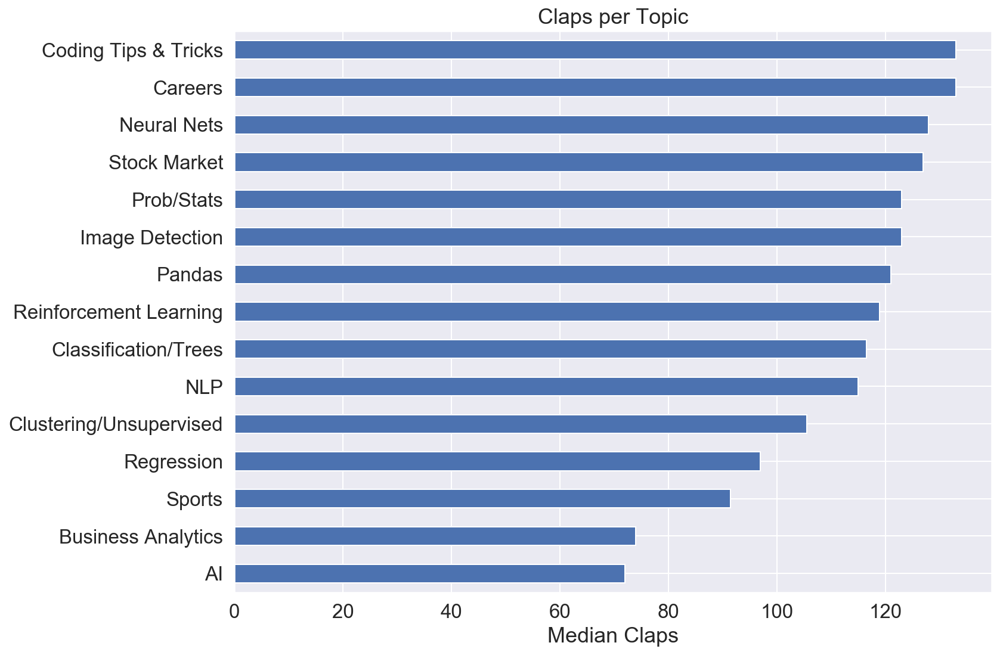

In [32]:
plt.figure(figsize=(12, 8))
claps_grouped = tds_data.groupby('topic_name').claps.median().sort_values()
# tds_data.groupby('topic_name').claps.mean().sort_values().plot(kind='barh')
claps_grouped.plot(kind='barh')
plt.xlabel('Median Claps')
plt.ylabel('')
plt.title('Claps per Topic')
plt.tight_layout()
# plt.savefig('median_claps_topic.svg');

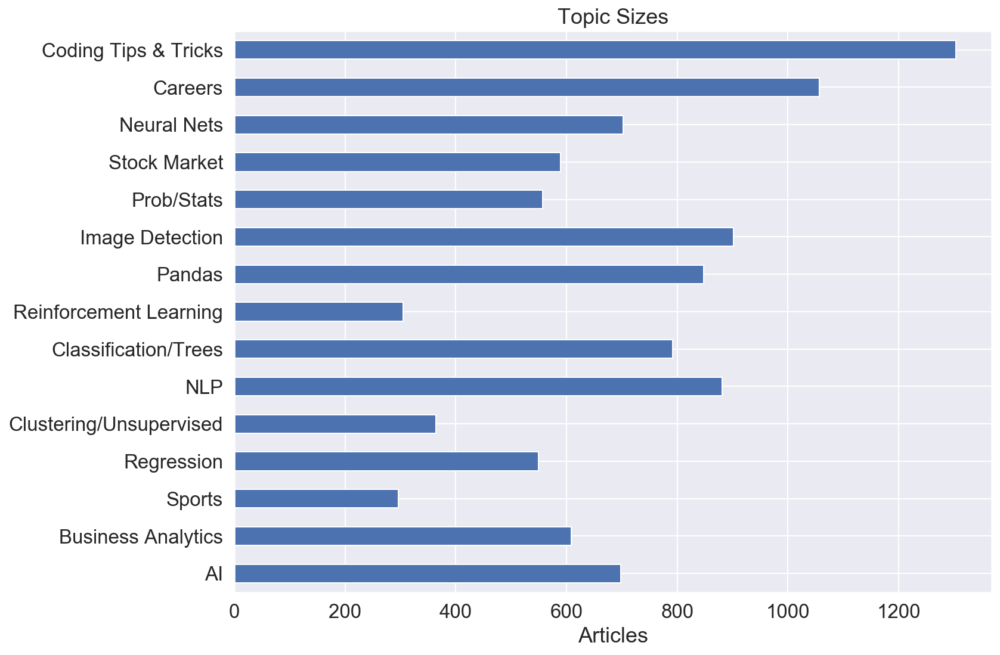

In [34]:
plt.figure(figsize=(12, 8))
tds_data.groupby('topic_name').topic.count()[claps_grouped.index].plot(kind='barh')
plt.xlabel('Articles')
plt.ylabel('')
plt.title('Topic Sizes')
plt.tight_layout()
# plt.savefig('topic_sizes.svg');

This figure was my main focal point for analysis. It shows that a number of the smaller topics (those that contained fewer articles) still received high amounts of claps. I took this to mean that more articles about these topics should be published because there is clearly a demand for content in these areas that isn't necessarily being met.

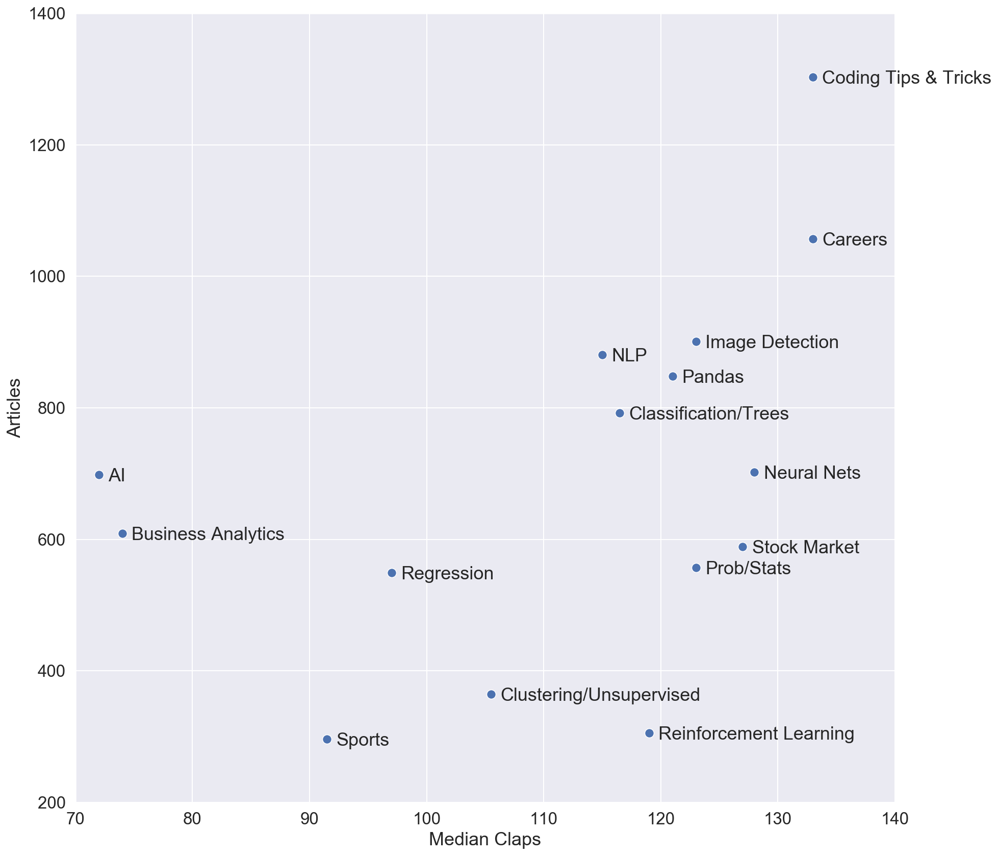

In [38]:
plt.figure(figsize=(14,12))
data = tds_data.groupby('topic').agg({'claps':'median', 'text':'count'}).sort_index()
data['name'] = data.index.map(topic_map)
sns.scatterplot(x='claps', y='text', data=data, s=80)

def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.8, point['y']-10, str(point['val']), size=18)

label_point(data.claps, data.text, data.name, plt.gca())

plt.xlabel('Median Claps')
plt.ylabel('Articles')
plt.xlim(70, 140)
plt.ylim(200, 1400)
plt.tight_layout()
# plt.savefig('article_clap_scatter.svg');

# Additional Visualization

These extra visualizations didn't inform my analysis at all, but they provide some cool ways of seeing the groupings of different topics in space.

In [23]:
nmf_sc = StandardScaler().fit_transform(topics)

## PCA

In [24]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=12)
nmf_pca = pca.fit_transform(nmf_sc)

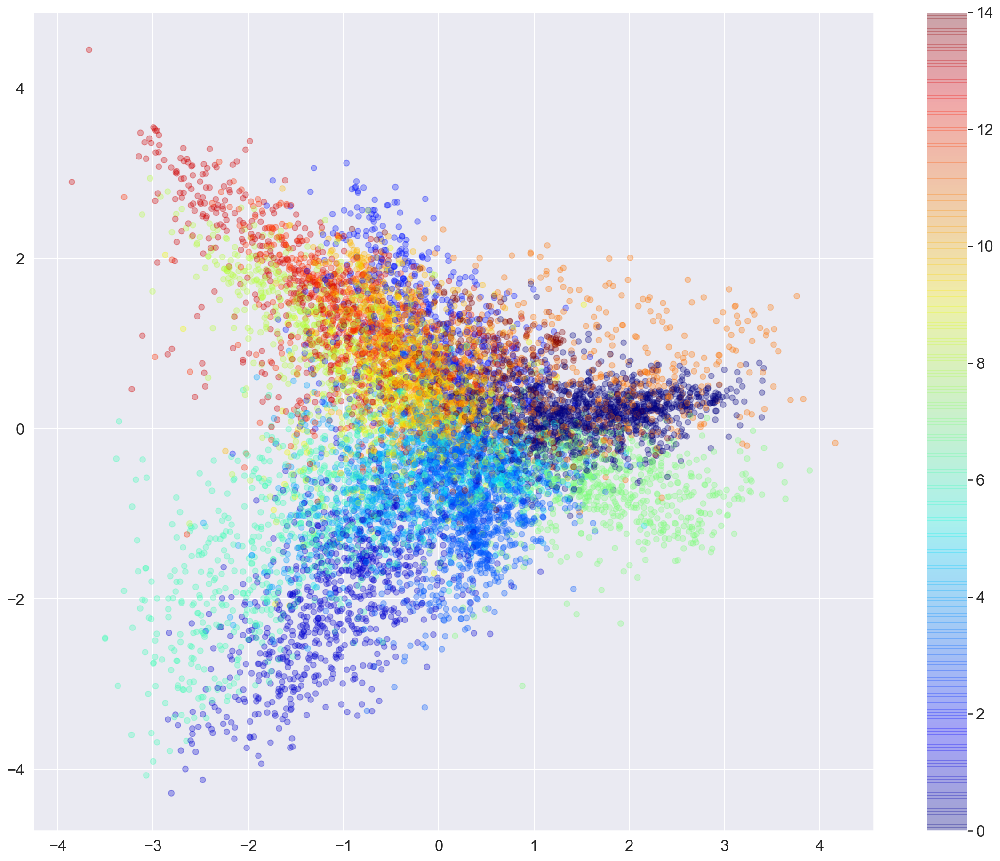

In [25]:
plt.figure(figsize=(20,16))
plt.scatter(nmf_pca[:,0], nmf_pca[:,1], c=nmf_sc.argmax(axis=1), cmap='jet', alpha=0.3)
plt.colorbar();

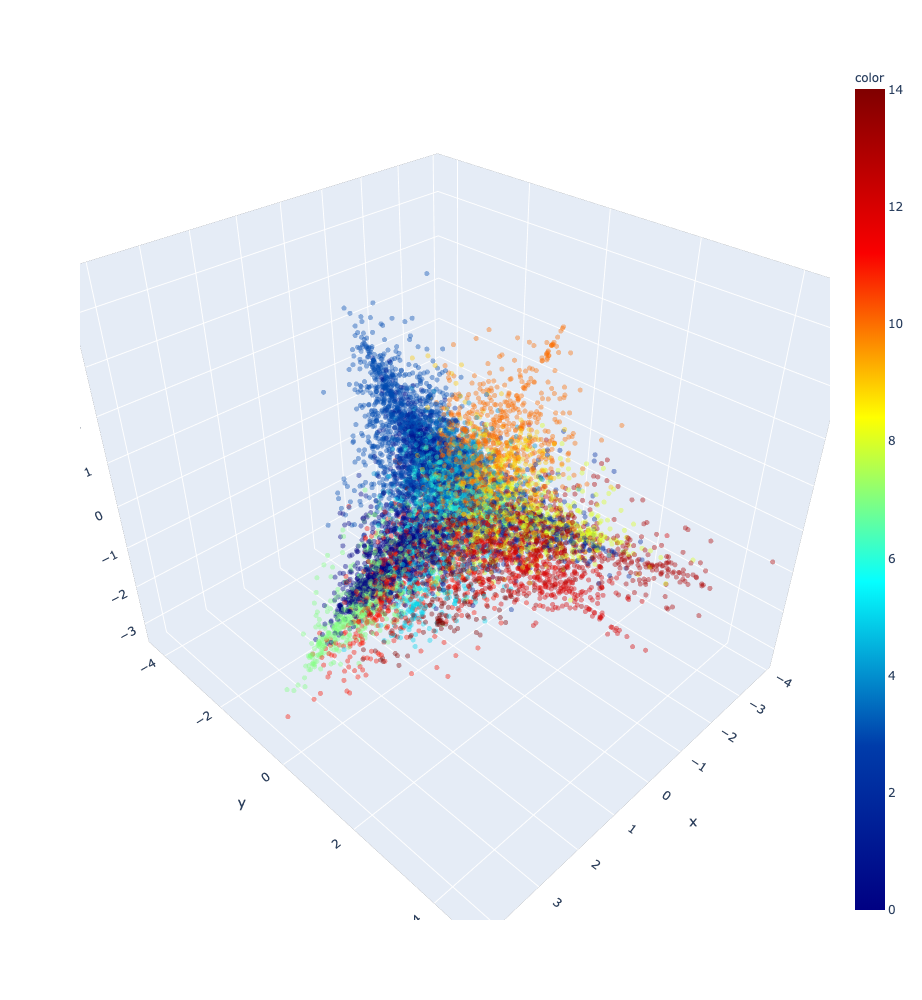

In [27]:
pca = PCA(n_components=3)
nmf_pca = pca.fit_transform(nmf_sc)

import plotly.express as px

fig = px.scatter_3d(nmf_pca, nmf_pca[:,0], nmf_pca[:,1], nmf_pca[:,2], color=tds_data.topic, color_continuous_scale='Jet')
fig.update_traces(marker=dict(size=3, opacity=0.4))
fig.update_layout(width=1000, height=1000)
fig.show()

## TSNE

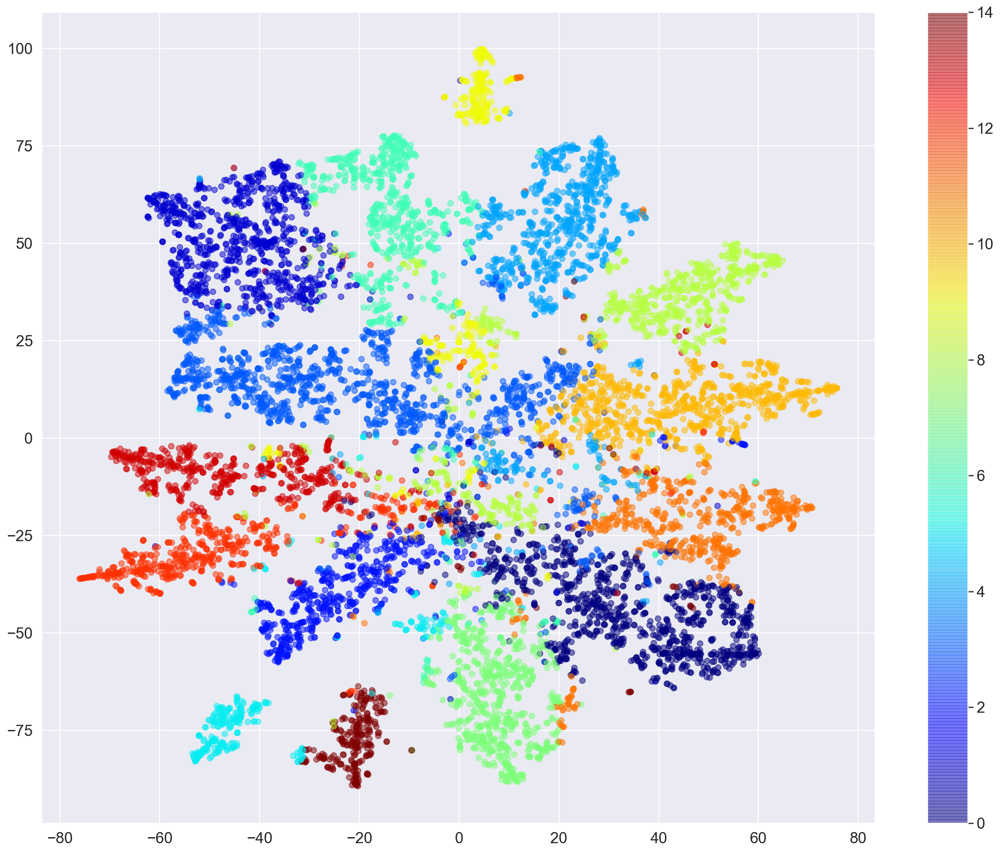

In [29]:
from sklearn.manifold import TSNE

model = TSNE(n_components=2, random_state=0, verbose=0)
low_data = model.fit_transform(nmf_sc)

plt.figure(figsize=(20,16))

plt.scatter(low_data[:,0], low_data[:,1], c=tds_data.topic, cmap='jet', alpha=.5)
plt.colorbar();

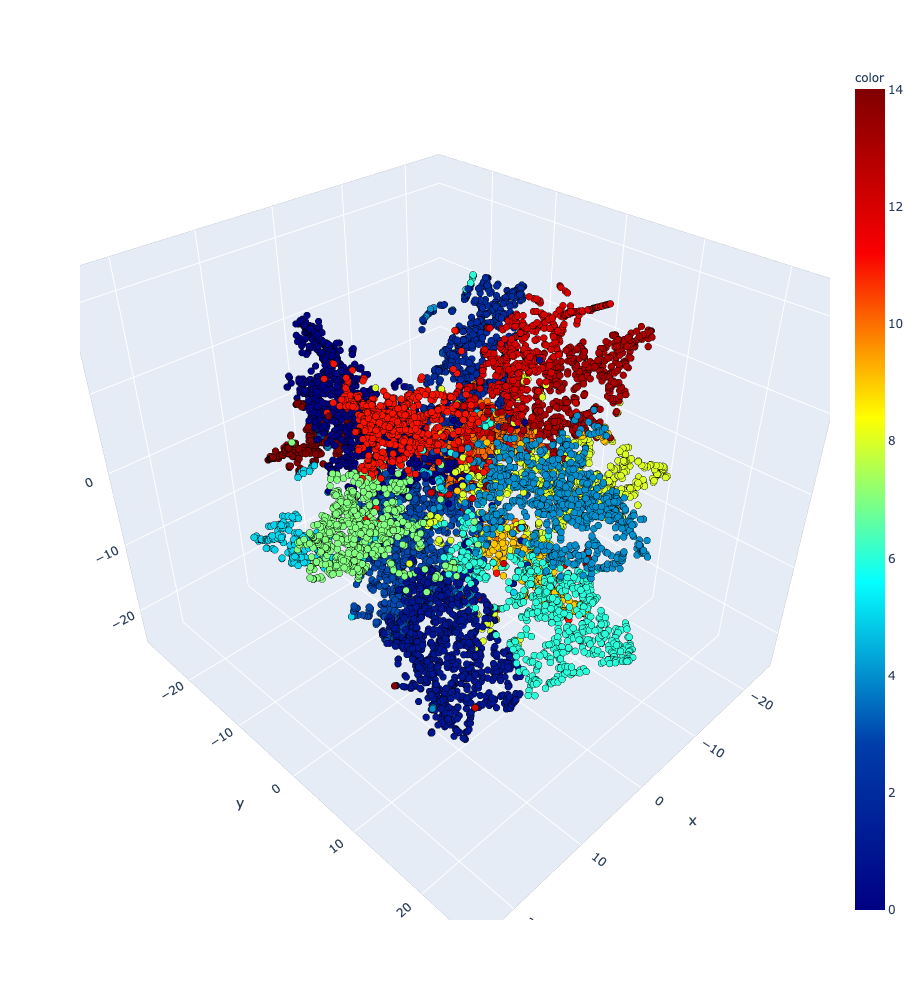

In [30]:
model = TSNE(n_components=3, random_state=0, verbose=0)
low_data = model.fit_transform(nmf_sc)

fig = px.scatter_3d(low_data, low_data[:,0], low_data[:,1], low_data[:,2], color=tds_data.topic, color_continuous_scale='Jet')
fig.update_traces(marker=dict(size=4, opacity=1, line=dict(width=0.5, color='black')))
fig.update_layout(width=1000, height=1000)
fig.show()